<a href="https://www.kaggle.com/code/nhatminhdang/airbnb-preprocessing-eda?scriptVersionId=238956364" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

<div style="text-align: left; background-color:#F19F9F; font-family: Trebuchet MS; color:#494545; padding: 12px; line-height:1.25;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 58px;border-style: solid;border-color: dark green;">🏠 AIRBNB OPEN DATA 🏠</div>
<div style="text-align: left; background-color:#D0F7BE ; font-family: Monaco; color:#0A3399; padding: 12px; line-height:1.25;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 18px">🌎 Author: Deng Qing Ming Ri 🌎</div>

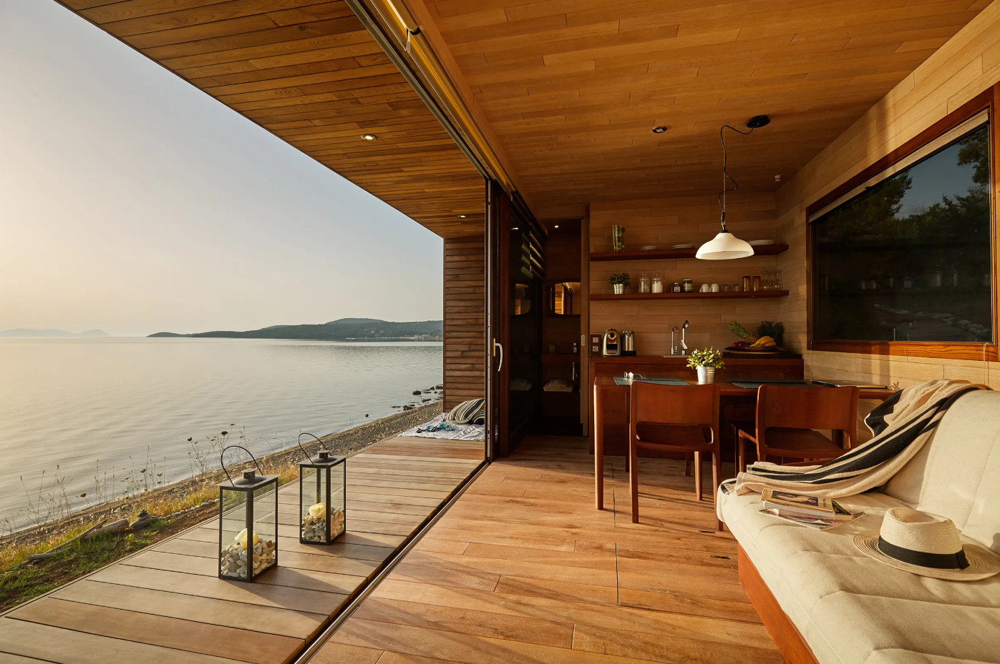

<a id='top'></a>
<div class="list-group" id="list-tab" role="tablist"></div>

## <div style="text-align: left; background-color:#ff4d4d; font-family: Trebuchet MS; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px">TABLE OF CONTENTS📝</div>
   
* [1. OBJECTIVES OF NOTEBOOK](#1)
    
* [2. IMPORTING LIBRARIES](#2)
    
* [3. LOADING DATA](#3)
    
* [4. DATA EXPLORATORY & CLEANING](#4)
    
* [5. DATA VISUALIZATION & ANALYSIS](#5)
    
* [6. AUTHOR MESSAGE](#6)

<a id="1"></a>
## <div style="text-align: left; background-color:#ff4d4d ; font-family: Trebuchet MS; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px">1. OBJECTIVES OF NOTEBOOK 📌</div> 

<div style="font-family: Segoe UI; line-height: 2; color: #000000; text-align: justify">
    👉 <b>This notebook aims to:</b>
    <ul>
      <li> <mark><b>Process raw data step by step</li>
      <li> <mark><b>Data visualization</li>
      <li> <mark><b>Exploring the relationship between attributes</li>

<a id="2"></a>
## <div style="text-align: left; background-color:#ff4d4d ; font-family: Trebuchet MS; color: BLACK; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px">2. IMPORTING LIBRARIES 📚</div> 

In [1]:
# data
import pandas as pd
import numpy as np

# visualization
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import missingno as msno

# styling
%matplotlib inline
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.facecolor'] = '#00000000'
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.facecolor'] = '#00000000'

import os
from wordcloud import WordCloud

# nltk
import nltk

import warnings
warnings.filterwarnings("ignore")


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


<a id="3"></a>
## <div style="text-align: left; background-color:#ff4d4d ; font-family: Trebuchet MS; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px">3. LOADING DATA 🧾 </div> 

### **<span style="color:#1E4640;"><center>Reading dataset</center></span>**

In [2]:
#Read data

df = pd.read_csv("/kaggle/input/airbnbopendata/Airbnb_Open_Data.csv")

### **<span style="color:#1E4640;"><center>Overview dataset</center></span>**

In [3]:
df.head(3).style.set_properties(**{'background-color':'#FFF0F5','color':'black','border-color':'#8b8c8c'})

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,country code,instant_bookable,cancellation_policy,room type,Construction year,price,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.647490,-73.972370,United States,US,False,strict,Private room,2020.000000,$966,$193,10.000000,9.000000,10/19/2021,0.210000,4.000000,6.000000,286.000000,Clean up and treat the home the way you'd like your home to be treated. No smoking.,nan
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.753620,-73.983770,United States,US,False,moderate,Entire home/apt,2007.000000,$142,$28,30.000000,45.000000,5/21/2022,0.380000,4.000000,2.000000,228.000000,Pet friendly but please confirm with me if the pet you are planning on bringing with you is OK. I have a cute and quiet mixed chihuahua. I could accept more guests (for an extra fee) but this also needs to be confirmed beforehand. Also friends traveling together could sleep in separate beds for an extra fee (the second bed is either a sofa bed or inflatable bed). Smoking is only allowed on the porch.,nan
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,nan,Elise,Manhattan,Harlem,40.809020,-73.941900,United States,US,True,flexible,Private room,2005.000000,$620,$124,3.000000,0.000000,nan,nan,5.000000,1.000000,352.000000,"I encourage you to use my kitchen, cooking and laundry facilities. There is no additional charge to use the washer/dryer in the basement. No smoking, inside or outside. Come home as late as you want. If you come home stumbling drunk, it's OK the first time. If you do it again, and you wake up me or the neighbors downstairs, we will be annoyed. (Just so you know . . . )",nan


In [4]:
# See (rows, columns)
df.shape

(102599, 26)

In [5]:
# detail every columns in dataset
df.columns

Index(['id', 'NAME', 'host id', 'host_identity_verified', 'host name',
       'neighbourhood group', 'neighbourhood', 'lat', 'long', 'country',
       'country code', 'instant_bookable', 'cancellation_policy', 'room type',
       'Construction year', 'price', 'service fee', 'minimum nights',
       'number of reviews', 'last review', 'reviews per month',
       'review rate number', 'calculated host listings count',
       'availability 365', 'house_rules', 'license'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102599 entries, 0 to 102598
Data columns (total 26 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              102599 non-null  int64  
 1   NAME                            102349 non-null  object 
 2   host id                         102599 non-null  int64  
 3   host_identity_verified          102310 non-null  object 
 4   host name                       102193 non-null  object 
 5   neighbourhood group             102570 non-null  object 
 6   neighbourhood                   102583 non-null  object 
 7   lat                             102591 non-null  float64
 8   long                            102591 non-null  float64
 9   country                         102067 non-null  object 
 10  country code                    102468 non-null  object 
 11  instant_bookable                102494 non-null  object 
 12  cancellation_pol

In [7]:
df.dtypes

id                                  int64
NAME                               object
host id                             int64
host_identity_verified             object
host name                          object
neighbourhood group                object
neighbourhood                      object
lat                               float64
long                              float64
country                            object
country code                       object
instant_bookable                   object
cancellation_policy                object
room type                          object
Construction year                 float64
price                              object
service fee                        object
minimum nights                    float64
number of reviews                 float64
last review                        object
reviews per month                 float64
review rate number                float64
calculated host listings count    float64
availability 365                  

In [8]:
df.describe()

,id,host id,lat,long,Construction year,minimum nights,number of reviews,reviews per month,review rate number,calculated host listings count,availability 365
count,1.025990e+05,1.025990e+05,102591.000000,102591.000000,102385.000000,102190.000000,102416.000000,86720.000000,102273.000000,102280.000000,102151.000000
mean,2.914623e+07,4.925411e+10,40.728094,-73.949644,2012.487464,8.135845,27.483743,1.374022,3.279106,7.936605,141.133254
std,1.625751e+07,2.853900e+10,0.055857,0.049521,5.765556,30.553781,49.508954,1.746621,1.284657,32.218780,135.435024
min,1.001254e+06,1.236005e+08,40.499790,-74.249840,2003.000000,-1223.000000,0.000000,0.010000,1.000000,1.000000,-10.000000
25%,1.508581e+07,2.458333e+10,40.688740,-73.982580,2007.000000,2.000000,1.000000,0.220000,2.000000,1.000000,3.000000
50%,2.913660e+07,4.911774e+10,40.722290,-73.954440,2012.000000,3.000000,7.000000,0.740000,3.000000,1.000000,96.000000
75%,4.320120e+07,7.399650e+10,40.762760,-73.932350,2017.000000,5.000000,30.000000,2.000000,4.000000,2.000000,269.000000
max,5.736742e+07,9.876313e+10,40.916970,-73.705220,2022.000000,5645.000000,1024.000000,90.000000,5.000000,332.000000,3677.000000


In [9]:
df.isnull().sum()

id                                     0
NAME                                 250
host id                                0
host_identity_verified               289
host name                            406
neighbourhood group                   29
neighbourhood                         16
lat                                    8
long                                   8
country                              532
country code                         131
instant_bookable                     105
cancellation_policy                   76
room type                              0
Construction year                    214
price                                247
service fee                          273
minimum nights                       409
number of reviews                    183
last review                        15893
reviews per month                  15879
review rate number                   326
calculated host listings count       319
availability 365                     448
house_rules     

In [10]:
df.corr()

,id,host id,lat,long,Construction year,minimum nights,number of reviews,reviews per month,review rate number,calculated host listings count,availability 365
id,1.000000,-0.000830,-0.008832,0.042546,0.001081,0.005668,-0.041530,0.038038,0.036633,0.024296,-0.139226
host id,-0.000830,1.000000,0.000661,-0.008999,0.004871,-0.002266,-0.004503,-0.001746,0.003459,0.001722,-0.002044
lat,-0.008832,0.000661,1.000000,0.074348,0.005697,0.014889,-0.025236,-0.019492,-0.003917,0.032468,-0.005011
long,0.042546,-0.008999,0.074348,1.000000,0.000861,-0.039639,0.069169,0.118598,0.015283,-0.104154,0.058428
Construction year,0.001081,0.004871,0.005697,0.000861,1.000000,-0.000486,0.001990,0.004092,0.004753,-0.002745,-0.008264
minimum nights,0.005668,-0.002266,0.014889,-0.039639,-0.000486,1.000000,-0.049997,-0.096141,-0.002167,0.084846,0.063541
number of reviews,-0.041530,-0.004503,-0.025236,0.069169,0.001990,-0.049997,1.000000,0.590939,-0.018412,-0.080907,0.099368
reviews per month,0.038038,-0.001746,-0.019492,0.118598,0.004092,-0.096141,0.590939,1.000000,0.037526,-0.025621,0.077193
review rate number,0.036633,0.003459,-0.003917,0.015283,0.004753,-0.002167,-0.018412,0.037526,1.000000,0.024273,-0.006217
calculated host listings count,0.024296,0.001722,0.032468,-0.104154,-0.002745,0.084846,-0.080907,-0.025621,0.024273,1.000000,0.159194


In [11]:
df.nunique()

id                                102058
NAME                               61281
host id                           102057
host_identity_verified                 2
host name                          13190
neighbourhood group                    7
neighbourhood                        224
lat                                21991
long                               17774
country                                1
country code                           1
instant_bookable                       2
cancellation_policy                    3
room type                              4
Construction year                     20
price                               1151
service fee                          231
minimum nights                       153
number of reviews                    476
last review                         2477
reviews per month                   1016
review rate number                     5
calculated host listings count        78
availability 365                     438
house_rules     

<h2 style="color:#034914 ;font-size: 1em "><b>🔎 Getting some unique values of each category

In [12]:
from IPython.core.display import HTML

#Acceps a list of IpyTable objects and returns a table which contains each IpyTable in a cell
def multi_table(table_list):
        return HTML('<table><tr style="background-color:white;">' +  ''.join(['<td>' + table._repr_html_() + '</td>' for table in table_list]) +'</tr></table>')
    

In [13]:
nunique_df={var:pd.DataFrame(df[var].value_counts())
           for var in {'host_identity_verified', 'neighbourhood group', 'instant_bookable',
                       'cancellation_policy','room type',"review rate number","Construction year"}}

multi_table([nunique_df['host_identity_verified'],nunique_df['neighbourhood group'],nunique_df['instant_bookable'],nunique_df['cancellation_policy'],nunique_df['room type'],nunique_df['review rate number'],nunique_df['Construction year']])

,host_identity_verified
unconfirmed,51200
verified,51110
,neighbourhood group
Manhattan,43792
Brooklyn,41842
Queens,13267
Bronx,2712
Staten Island,955
brookln,1
manhatan,1


<a id="4"></a>
## <div style="text-align: left; background-color:#ff4d4d ; font-family: Trebuchet MS; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px">4. DATA EXPLORATORY & CLEANING 🛠  </div> 

<h2 style="color:#034914 ;font-size: 1em "><b>🔎 Convert column names to a common format: all lowercase and joined by "_"

In [14]:
df.columns=[col.lower().replace(" ","_") for col in df.columns]
df.columns

Index(['id', 'name', 'host_id', 'host_identity_verified', 'host_name',
       'neighbourhood_group', 'neighbourhood', 'lat', 'long', 'country',
       'country_code', 'instant_bookable', 'cancellation_policy', 'room_type',
       'construction_year', 'price', 'service_fee', 'minimum_nights',
       'number_of_reviews', 'last_review', 'reviews_per_month',
       'review_rate_number', 'calculated_host_listings_count',
       'availability_365', 'house_rules', 'license'],
      dtype='object')

<h2 style="color:#034914 ;font-size: 1em "><b>🔎 Count the missing values of every column in terms of % and show the result

In [15]:
# calculate the % missing values
percentage_result = df.isnull().sum()/df.shape[0] * 100
# create a DataFrame to show case the result
percentage_result = pd.DataFrame({"columns": percentage_result.keys(), "% missing": percentage_result})
percentage_result.reset_index(drop=True, inplace=True)
percentage_result

,columns,% missing
0,id,0.000000
1,name,0.243667
2,host_id,0.000000
3,host_identity_verified,0.281679
4,host_name,0.395715
5,neighbourhood_group,0.028265
6,neighbourhood,0.015595
7,lat,0.007797
8,long,0.007797
9,country,0.518524


<h2 style="color:#034914 ;font-size: 1em "><b>🔎 id and host_id columns:

In [16]:
df["id"].unique().shape[0]/df["id"].shape[0]*100

99.47270441232371

In [17]:
df["host_id"].unique().shape[0]/df["host_id"].shape[0]*100

99.47172974395461

🎈 Most of these values are distinct for each line. I don't think it makes sense for analysis, so I'll delete them.

In [18]:
df.drop(columns=["id","host_id"],axis=1,inplace=True)

In [19]:
df.head(3)

,name,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,country,country_code,instant_bookable,...,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules,license
0,Clean & quiet apt home by the park,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,US,False,...,$193,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,NaN
1,Skylit Midtown Castle,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,US,False,...,$28,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,NaN
2,THE VILLAGE OF HARLEM....NEW YORK !,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,US,True,...,$124,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN


<h2 style="color:#034914 ;font-size: 1em "><b>🔎 country_code and country column: 

In [20]:
df["country_code"].value_counts()

US    102468
Name: country_code, dtype: int64

In [21]:
df["country"].value_counts()

United States    102067
Name: country, dtype: int64

🎈 We can drop these 2 columns because there is no variations

In [22]:
df.drop(columns=["country_code","country"],axis=1,inplace=True)

In [23]:
df.head(3)

,name,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,instant_bookable,cancellation_policy,room_type,...,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules,license
0,Clean & quiet apt home by the park,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,False,strict,Private room,...,$193,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,NaN
1,Skylit Midtown Castle,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,False,moderate,Entire home/apt,...,$28,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,NaN
2,THE VILLAGE OF HARLEM....NEW YORK !,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,True,flexible,Private room,...,$124,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN


<h2 style="color:#034914 ;font-size: 1em "><b>🔎 price and service_fee columns:

🎈 Convert from object type to float64: remove the $ sign and unwanted characters from the records.

In [24]:
def remove_dollar_sign(value):
    if pd.isna(value):
        return np.NaN
    else:
        return float(value.replace("$","").replace(",","").replace(" ",""))

In [25]:
df["price"]=df["price"].apply(lambda x: remove_dollar_sign(x))

In [26]:
df["price"]

0          966.0
1          142.0
2          620.0
3          368.0
4          204.0
           ...  
102594     844.0
102595     837.0
102596     988.0
102597     546.0
102598    1032.0
Name: price, Length: 102599, dtype: float64

In [27]:
df["service_fee"]=df["service_fee"].apply(lambda x: remove_dollar_sign(x))

In [28]:
df["service_fee"]

0         193.0
1          28.0
2         124.0
3          74.0
4          41.0
          ...  
102594    169.0
102595    167.0
102596    198.0
102597    109.0
102598    206.0
Name: service_fee, Length: 102599, dtype: float64

<h2 style="color:#034914 ;font-size: 1em "><b>🔎 last_review column:

In [29]:
df["last_review"]=pd.to_datetime(df["last_review"])

<h2 style="color:#034914 ;font-size: 1em "><b>🔎 house_rules and license columns:

🎈 Because there are a high number of Nan values, I will delete them.

In [30]:
df.drop(columns=["house_rules","license"], axis=1, inplace=True)

<h2 style="color:#034914 ;font-size: 1em "><b>✅ Data after processing

In [31]:
df.sample(5)

,name,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365
68604,Manhattan room with a fire escape!,unconfirmed,Elina,Manhattan,Washington Heights,40.83636,-73.94487,False,moderate,Private room,2016.0,719.0,144.0,2.0,81.0,2019-07-06,3.80,2.0,1.0,11.0
72673,Cozy Private Brooklyn Bed room,verified,Gabriel,Brooklyn,Crown Heights,40.66754,-73.95265,False,strict,Private room,2010.0,583.0,117.0,4.0,3.0,2016-04-30,0.07,1.0,1.0,0.0
12468,Cozy Private Room in Williamsburg,unconfirmed,Manon,Brooklyn,Williamsburg,40.71710,-73.95273,False,moderate,Entire home/apt,2018.0,232.0,46.0,4.0,1.0,2015-12-23,0.02,5.0,1.0,47.0
11966,Sunny Bedroom in Park Slope,unconfirmed,Jason,Brooklyn,South Slope,40.66641,-73.99078,True,moderate,Private room,2003.0,1108.0,222.0,3.0,7.0,2018-04-01,0.16,5.0,2.0,-6.0
78426,Peaceful room in hip BK area 15 min to Manhattan,verified,Cleo,Brooklyn,Bedford-Stuyvesant,40.68869,-73.92310,False,moderate,Private room,2017.0,300.0,60.0,1.0,10.0,2019-06-27,0.35,1.0,1.0,173.0


In [32]:
df.shape

(102599, 20)

In [33]:
df.dtypes

name                                      object
host_identity_verified                    object
host_name                                 object
neighbourhood_group                       object
neighbourhood                             object
lat                                      float64
long                                     float64
instant_bookable                          object
cancellation_policy                       object
room_type                                 object
construction_year                        float64
price                                    float64
service_fee                              float64
minimum_nights                           float64
number_of_reviews                        float64
last_review                       datetime64[ns]
reviews_per_month                        float64
review_rate_number                       float64
calculated_host_listings_count           float64
availability_365                         float64
dtype: object

In [34]:
df.isnull().sum()

name                                250
host_identity_verified              289
host_name                           406
neighbourhood_group                  29
neighbourhood                        16
lat                                   8
long                                  8
instant_bookable                    105
cancellation_policy                  76
room_type                             0
construction_year                   214
price                               247
service_fee                         273
minimum_nights                      409
number_of_reviews                   183
last_review                       15893
reviews_per_month                 15879
review_rate_number                  326
calculated_host_listings_count      319
availability_365                    448
dtype: int64

In [35]:
df.nunique()

name                              61281
host_identity_verified                2
host_name                         13190
neighbourhood_group                   7
neighbourhood                       224
lat                               21991
long                              17774
instant_bookable                      2
cancellation_policy                   3
room_type                             4
construction_year                    20
price                              1151
service_fee                         231
minimum_nights                      153
number_of_reviews                   476
last_review                        2477
reviews_per_month                  1016
review_rate_number                    5
calculated_host_listings_count       78
availability_365                    438
dtype: int64

<a id="5"></a>
## <div style="text-align: left; background-color:#ff4d4d ; font-family: Trebuchet MS; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px">5. DATA VISUALIZATION & ANALYSIS 📊  </div> 

In [36]:
# create a function to plot bar chart

def plot_bar_chart(column_name: str, hue: str=None, top_values: int = None, palette: str = "flare", show_grid : bool = True, 
                   figsize: tuple = (16, 9), bar_font_size: int=14, bar_angle: int=45, angle: int=45):
    fig = plt.figure(facecolor = (247/255, 247/255, 247/255), figsize = figsize)
    ax = plt.subplot(1, 1, 1)
    
    ax.set_facecolor((247/255, 247/255, 247/255))
    counts = None
    
    if top_values is not None:
        counts = df[column_name].value_counts().iloc[:top_values]
    else:
        counts = df[column_name].value_counts()
        
    bar_ax = sns.barplot(x = counts.keys(), y = counts, palette = palette, ax = ax, hue = df[hue] if hue is not None else None) 
    
    for i in bar_ax.containers:
        bar_ax.bar_label(i, rotation=bar_angle, fontsize = bar_font_size)
        
    plt.xticks(rotation = angle, fontsize = 14)
    plt.xlabel(f"{column_name}", fontweight="bold", fontsize = 18)
    plt.ylabel("count", fontweight="bold", fontsize = 18)
    plt.title(f"Top {top_values} {column_name}" if top_values is not None else f"{column_name}", fontsize = 27)
    if show_grid: plt.grid()
    plt.show()

<h2 style="color:#034914 ;font-size: 1em "><b>📊 Top 30 popular name

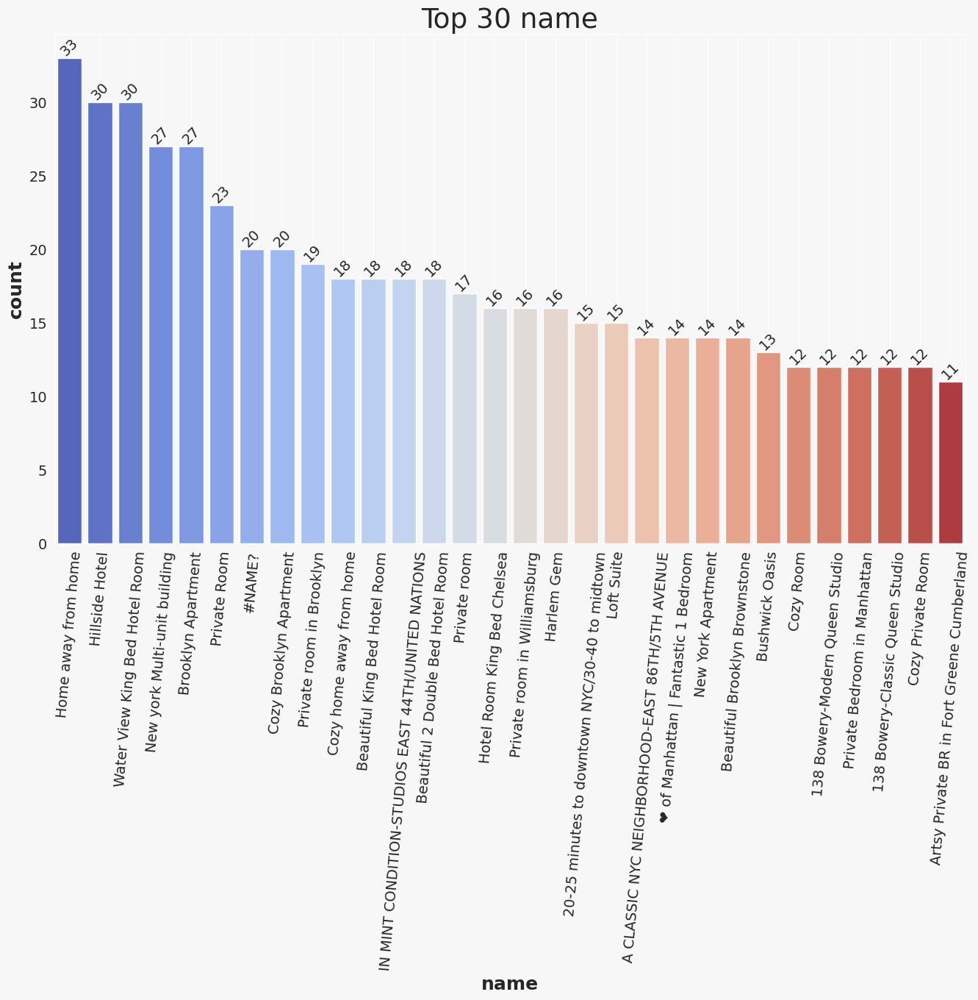

In [37]:
plot_bar_chart(column_name = "name", top_values = 30, palette = "coolwarm", show_grid = True, angle = 85)

<h2 style="color:#034914 ;font-size: 1em "><b>📊 Top 30 popular host_name  

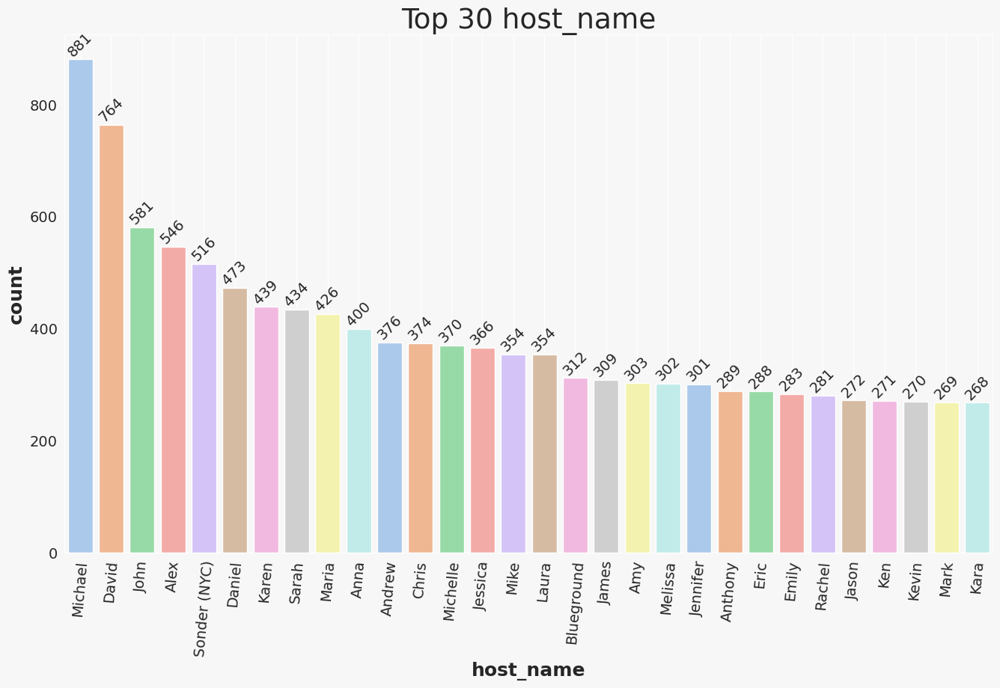

In [38]:
plot_bar_chart(column_name = "host_name", top_values = 30, palette = "pastel", show_grid = True, angle = 85)

<h2 style="color:#034914 ;font-size: 1em "><b>📊 Top 30 popular neighbourhood

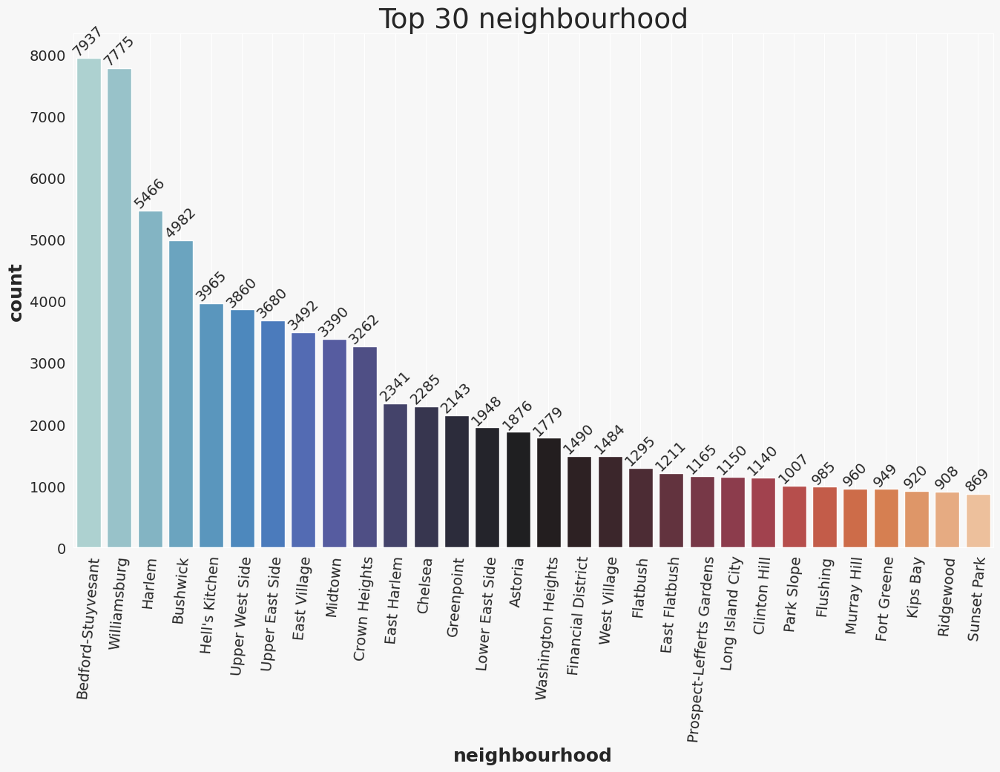

In [39]:
plot_bar_chart(column_name = "neighbourhood", top_values = 30, palette = "icefire", show_grid = True, angle = 85)

<h2 style="color:#034914 ;font-size: 1em "><b>📊 host_identity_verified

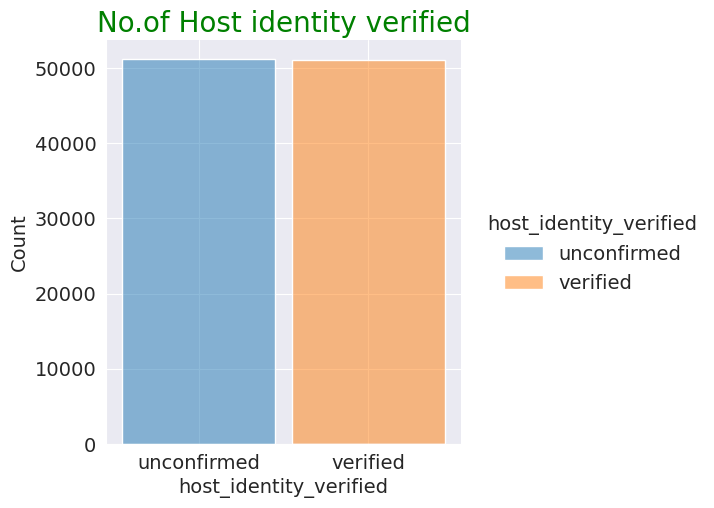

In [40]:
sns.displot(df,x="host_identity_verified", hue="host_identity_verified", shrink=0.9);
plt.title("No.of Host identity verified", size=20, color="green");

<h2 style="color:#034914 ;font-size: 1em "><b>📊 neighbourhood_group 

In [41]:
df['tmp']=1
fig=px.pie(df, names="neighbourhood_group", values='tmp',hole=0.6, title="Neighbourhood group distribution")
fig.update_traces(textposition='outside', textinfo='percent+label')
fig.update_layout(title_text="Neighbourhood group percentage",
                  annotations=[dict(text='Neighbourhood group', x=0.5, y=0.5, font_size=10, showarrow=False)])


🎈 Most of the neighbourhood are Brooklyn and Manhattan, over 40%

<h2 style="color:#034914 ;font-size: 1em "><b>📊 cancellation_policy

In [42]:
df['tmp']=1
fig=px.pie(df, names="cancellation_policy", values='tmp',hole=0.6, title="Cancellation policy distribution")
fig.update_traces(textposition='outside', textinfo='percent+label')
fig.update_layout(title_text="Cancellation policy percentage",
                  annotations=[dict(text='Cancellation policy', x=0.5, y=0.5, font_size=10, showarrow=False)])

<h2 style="color:#034914 ;font-size: 1em "><b>📊 room_type  

In [43]:
roomtype=df["room_type"].value_counts()
fig=px.pie(values=roomtype.values,
          names=roomtype.index,
          color_discrete_sequence=px.colors.sequential.RdBu,
          title="Room type distribution", template="presentation")
fig.update_traces(textinfo="label+percent+value", textfont_size=13,
                 marker=dict(line=dict(color='#100000', width=0.2)))

fig.data[0].marker.line.width=2
fig.data[0].marker.line.color='gray'
fig.show()

In [44]:
df['tmp']=1
fig=px.pie(df, names="room_type", values='tmp',hole=0.6,color_discrete_sequence=px.colors.sequential.RdBu, title="Room type distribution",template="presentation")
fig.update_traces(textposition='outside', textinfo='percent+label')
fig.update_layout(title_text="Room type distribution percentage",
                  annotations=[dict(text='Room type distribution', x=0.5, y=0.5, font_size=10, showarrow=False)])
fig.data[0].marker.line.width=2
fig.data[0].marker.line.color='gray'
fig.show()

🎈Mostly Private room and Ebtire home/apt. Very few Shared room and Hotel room types.


<h2 style="color:#034914 ;font-size: 1em "><b>📊 construction_year 

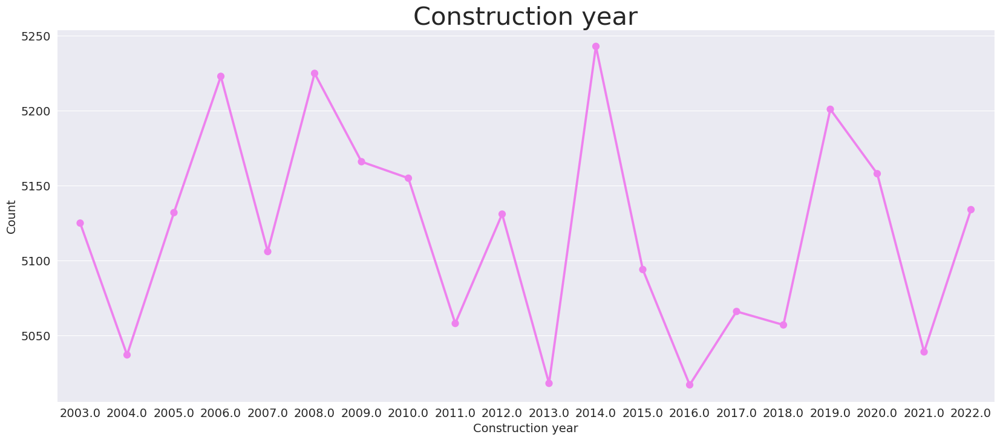

In [45]:
year=df["construction_year"].value_counts()
plt.figure(figsize=(20,8))
sns.pointplot(x=year.index, y=year.values, color='violet')
plt.xlabel("Construction year")
plt.ylabel("Count")
plt.title("Construction year", size=30);

<h2 style="color:#034914 ;font-size: 1em "><b>📊 Relationship between price and service fee

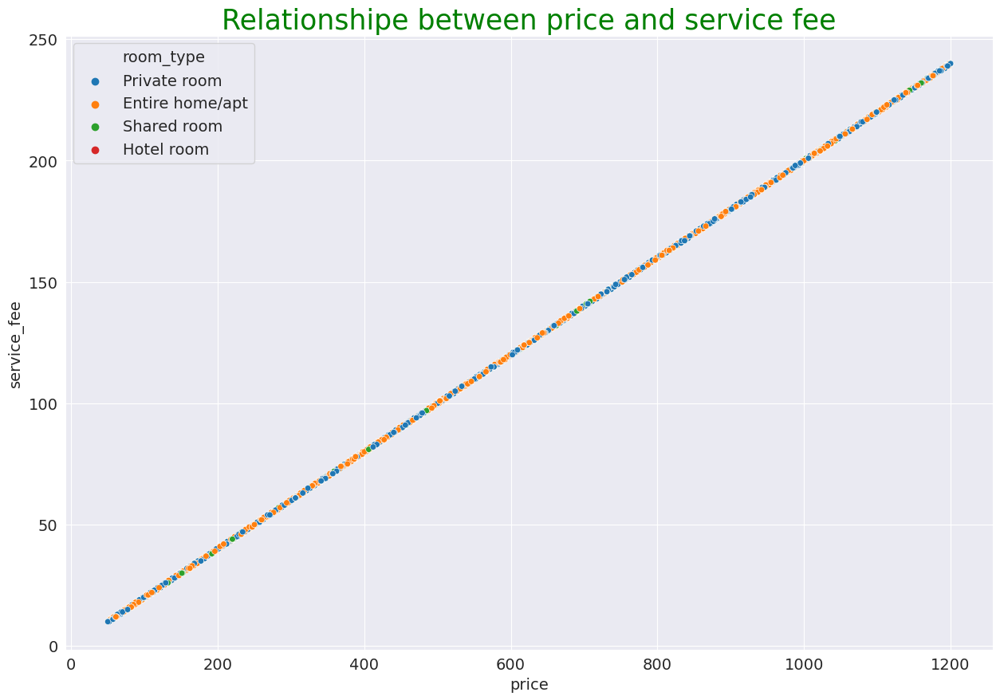

In [46]:
plt.figure(figsize=(15,10))
plt.title("Relationshipe between price and service fee", size=25, color="green")
sns.scatterplot(x=df.price, y=df.service_fee, hue=df.room_type, s=30);

🎈If the room price is high, the service price will also be high in all room types.

<h2 style="color:#034914 ;font-size: 1em "><b>📊 Relationship between review_rate_number and room_type

In [47]:
px.histogram(df, x="room_type", color="review_rate_number", barmode="group", title="Count of each review rate number")

<h2 style="color:#034914 ;font-size: 1em "><b>📊 Relationship between room_type and price

In [48]:
price_room_df=df.query("price!='Nan'")
price_room_df["price"]=df["price"]
price_room_df

,name,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,instant_bookable,cancellation_policy,room_type,...,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,tmp
0,Clean & quiet apt home by the park,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,False,strict,Private room,...,966.0,193.0,10.0,9.0,2021-10-19,0.21,4.0,6.0,286.0,1
1,Skylit Midtown Castle,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,False,moderate,Entire home/apt,...,142.0,28.0,30.0,45.0,2022-05-21,0.38,4.0,2.0,228.0,1
2,THE VILLAGE OF HARLEM....NEW YORK !,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,True,flexible,Private room,...,620.0,124.0,3.0,0.0,NaT,NaN,5.0,1.0,352.0,1
3,NaN,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,True,moderate,Entire home/apt,...,368.0,74.0,30.0,270.0,2019-07-05,4.64,4.0,1.0,322.0,1
4,Entire Apt: Spacious Studio/Loft by central park,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,False,moderate,Entire home/apt,...,204.0,41.0,10.0,9.0,2018-11-19,0.10,3.0,1.0,289.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102594,Spare room in Williamsburg,verified,Krik,Brooklyn,Williamsburg,40.70862,-73.94651,False,flexible,Private room,...,844.0,169.0,1.0,0.0,NaT,NaN,3.0,1.0,227.0,1
102595,Best Location near Columbia U,unconfirmed,Mifan,Manhattan,Morningside Heights,40.80460,-73.96545,True,moderate,Private room,...,837.0,167.0,1.0,1.0,2015-07-06,0.02,2.0,2.0,395.0,1
102596,"Comfy, bright room in Brooklyn",unconfirmed,Megan,Brooklyn,Park Slope,40.67505,-73.98045,True,moderate,Private room,...,988.0,198.0,3.0,0.0,NaT,NaN,5.0,1.0,342.0,1
102597,Big Studio-One Stop from Midtown,unconfirmed,Christopher,Queens,Long Island City,40.74989,-73.93777,True,strict,Entire home/apt,...,546.0,109.0,2.0,5.0,2015-10-11,0.10,3.0,1.0,386.0,1


In [49]:
fig = px.box(price_room_df,
             x     = 'room_type',
             y     = 'price',
             color = 'room_type',
             title = 'Room_type x Price',
             color_discrete_sequence = ['#03cffc','#0362fc','#eb03fc','#0ecc83'],
            )

fig.update_layout(showlegend=False)
fig.update_yaxes(range=[0,220], title='Price')
fig.update_xaxes(title='Room type')
fig.show()

<h2 style="color:#034914 ;font-size: 1em "><b>📊 Word Cloud of Neighbourhood

In [50]:
def Freq_df(cleanwordlist):
    Freq_dist_nltk = nltk.FreqDist(cleanwordlist)
    df_freq = pd.DataFrame.from_dict(Freq_dist_nltk, orient='index')
    df_freq.columns = ['Frequency']
    df_freq.index.name = 'Term'
    df_freq = df_freq.sort_values(by=['Frequency'],ascending=False)
    df_freq = df_freq.reset_index()
    return df_freq

def Word_Cloud(data, color_background, colormap, title):
    plt.figure(figsize = (20,15))
    wc = WordCloud(width=1200, 
               height=600, 
               max_words=50,
               colormap= colormap,
               max_font_size = 100,
               random_state=88, 
               background_color=color_background).generate_from_frequencies(data)
    plt.imshow(wc, interpolation='bilinear')
    plt.title(title, fontsize=20)
    plt.axis('off')
    plt.show()

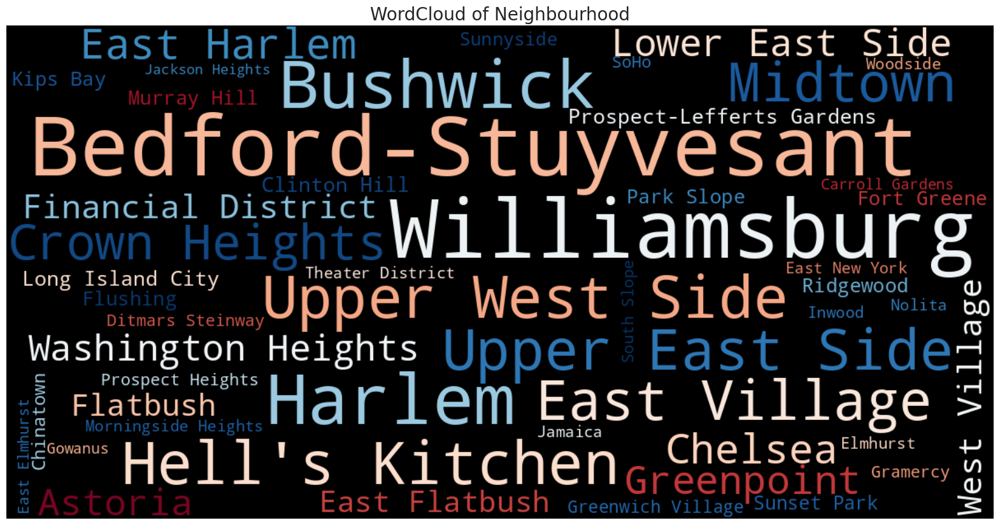

In [51]:
freq_df = Freq_df(df['neighbourhood'].values.tolist())
data = dict(zip(freq_df['Term'].tolist(), freq_df['Frequency'].tolist()))
data = freq_df.set_index('Term').to_dict()['Frequency']

Word_Cloud(data ,'black','RdBu', 'WordCloud of Neighbourhood')

<a id="6"></a>
## <div style="text-align: left; background-color:#ff4d4d ; font-family: Trebuchet MS; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px">AUTHOR MESSAGE 🔗</div> 

<div style="border-radius:10px;
            border :#0A0104 solid;
            padding: 15px;
            background-color:#ff4d4d ;
            color: black;
           font-size:110%;
            text-align: left">
<p style="font-family:newtimeroman;font-size:130%;text-align:center;border-radius:20px 20px;"> If you liked this Notebook, please do upvote.<br> If you have any questions, feel free to comment!<br> ✨Best Wishes✨</p>